In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import json
import os
import random
from scipy.stats import linregress

from functions import DataAnalyze_new


In [2]:
from functions import DataAnalyze_new


In [3]:
pilot3 = DataAnalyze_new("25-03-07-1109_setting0")


Eye raw data obtained
Log data obtained
9


In [7]:
pilot3.log_data

NameError: name 'pilot3' is not defined

incorrect count: 13
incorrect trial list: [ 20  52  71  96 163 189 196 203 206 212 232 235 269]
Number of incorrect trials per block:
Block 0: 1 incorrect trials
Block 1: 1 incorrect trials
Block 2: 1 incorrect trials
Block 3: 1 incorrect trials
Block 4: 0 incorrect trials
Block 5: 1 incorrect trials
Block 6: 4 incorrect trials
Block 7: 3 incorrect trials
Block 8: 1 incorrect trials


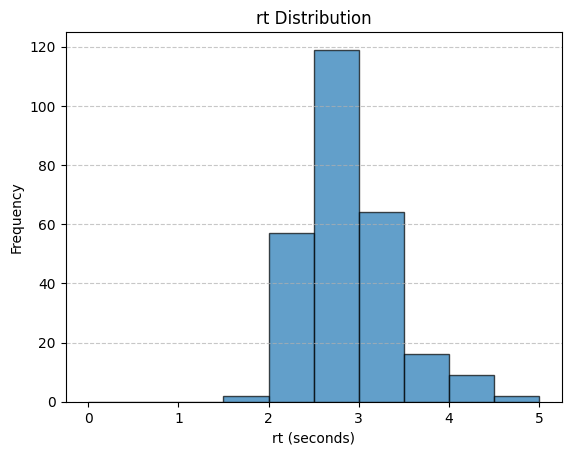

In [7]:
pilot3.show_performance()

In [4]:
pilot3.block_entropy

[1.3502864928199738,
 1.4689955935892811,
 1.3502864928199738,
 1.8812908992306927,
 0.9379911871785622,
 1.8812908992306927,
 2.0,
 1.7625817984613854,
 1.4689955935892811]

In [3]:
pilot3.get_pupil_statistics_raw()


processing trial 1
processing trial 2
processing trial 3
processing trial 4
processing trial 5
processing trial 6
processing trial 7
processing trial 8
processing trial 9
processing trial 10
processing trial 11
processing trial 12
processing trial 13
processing trial 14
processing trial 15
processing trial 16
processing trial 17
processing trial 18
processing trial 19
processing trial 20
processing trial 21
processing trial 22
processing trial 23
processing trial 24
processing trial 25
processing trial 26
processing trial 27
processing trial 28
processing trial 29
        Type Event  Time   TimeEvent  Offset  trial_index      X      Y  \
141904  Gaze   NaN   NaN  348.875022     NaN           29  637.0  605.0   
141905  Gaze   NaN   NaN  348.876022     NaN           29  636.8  603.2   
141906  Gaze   NaN   NaN  348.877022     NaN           29  659.2  532.8   
141907  Gaze   NaN   NaN  348.878022     NaN           29  659.2  532.4   
141908  Gaze   NaN   NaN  348.879022     NaN          

ValueError: No valid 'TimeEvent' found in trial 41 for event sound.

In [4]:
def get_pupil_statistics_raw(plot = False):

    # Loop through each trial
    for trial_index in range(1, pilot3.num_trials + 1):

        if np.all(pilot3.pupil_statistics_raw[trial_index-1, :, :] != 0):
            continue
        else:
            print("processing trial", trial_index)
            # Get the data for the current trial, ensuring that Pupil values are not NaN
            _trial_data = pilot3.eye_raw[pilot3.eye_raw['trial_index'] == trial_index].copy()
            
            # List of events we care about ('cue', 'sound', and 'response')
            events = ['cue', 'sound', 'response']
            for event in events:
                # Map events to labels and event numbers
                if event == 'sound':
                    label = 'start decision window'
                    event_num = 1
                elif event == 'cue':
                    label = 'show cue'
                    event_num = 0
                elif event == 'response':
                    label = 'response'
                    event_num = 2
                    if trial_index == 29:
                        print(_trial_data[_trial_data['event'] == label].dropna(subset=['TimeEvent']))
                # Try to get the event time for the current event in the trial
                try:
                    event_time = _trial_data[_trial_data['event'] == label].dropna(subset=['TimeEvent'])['TimeEvent'].iloc[0]
                except IndexError:
                    if not plot:
                    raise ValueError(f"No valid 'TimeEvent' found in trial {trial_index} for event {event}.")

        
                # Define the time window for extracting pupil data
                start_bound = event_time + 0.5  # Start of the window (0.5 seconds after the event)
                end_bound = event_time + 2      # End of the window (2 seconds after the event)

                trial_data = _trial_data[_trial_data['Pupil'].notna()].copy()

                # Apply filtering to remove blinks or any unwanted data
                processed_trial_data = pilot3.filter_eye_data_diff_blink(trial_data, [trial_index], plot=False)

                # Filter the processed trial data to only include the relevant time window
                processed_event_data = processed_trial_data[
                    (processed_trial_data['TimeEvent'] >= start_bound) & 
                    (processed_trial_data['TimeEvent'] <= end_bound)
                ]

                # Check if any data exists for the time window
                if processed_event_data.empty:
                    raise ValueError(f"Error: processed_event_data is empty for trial {trial_index} and event {event}. Check filtering conditions.")

                # Calculate the pupil statistics for the current event
                pupil_max = processed_event_data['Pupil'].max()  # Max pupil size in the time window
                pupil_mean = processed_event_data['Pupil'].mean()  # Mean pupil size in the time window
                pupil_median = processed_event_data['Pupil'].median()  # median pupil size in the time window

                # Store the statistics (max, mean) in the correct spot in the array
                pilot3.pupil_statistics_raw[trial_index - 1, event_num, 0] = pupil_max
                pilot3.pupil_statistics_raw[trial_index - 1, event_num, 1] = pupil_mean
                pilot3.pupil_statistics_raw[trial_index - 1, event_num, 2] = pupil_median

    return pilot3.pupil_statistics_raw


In [5]:
get_pupil_statistics_raw()


processing trial 41


ValueError: No valid 'TimeEvent' found in trial 41 for event sound.

In [13]:
pilot3.log_data[pilot3.log_data['trial_index']==41]['rt'].values[0]

3.032176900014747

In [16]:
_trial_data = pilot3.eye_raw[pilot3.eye_raw['trial_index'] == 41]

In [22]:
_trial_data[_trial_data['event'] == 'response']#.dropna(subset=['TimeEvent'])#['TimeEvent'].iloc[0]

,Type,Event,Time,TimeEvent,Offset,trial_index,X,Y,Pupil,event,Start,End,Duration,Eye,Start_X,Start_Y,End_X,End_Y,Amplitude,Peak_Velocity
198087,Blink,NaN,NaN,NaN,NaN,41,NaN,NaN,NaN,response,437.871113,439.282113,1.412,NaN,NaN,NaN,NaN,NaN,NaN,NaN
198088,Gaze,NaN,NaN,439.283113,NaN,41,766.2,1047.6,1013.0,response,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
198089,Gaze,NaN,NaN,439.284113,NaN,41,766.2,1047.6,1013.0,response,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
198090,Gaze,NaN,NaN,439.285113,NaN,41,808.7,1064.4,1084.0,response,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
198091,Gaze,NaN,NaN,439.286113,NaN,41,808.7,1064.4,1101.0,response,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199868,Gaze,NaN,NaN,441.056113,NaN,41,661.3,536.8,2215.0,response,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
199869,Gaze,NaN,NaN,441.057113,NaN,41,661.2,537.2,2219.0,response,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
199870,Gaze,NaN,NaN,441.058113,NaN,41,661.0,537.8,2224.0,response,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
199871,Gaze,NaN,NaN,441.059113,NaN,41,660.8,536.3,2225.0,response,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
_trial_data['event'].unique()

array([nan, 'show fixation', 'show cue', 'response', 'done'], dtype=object)

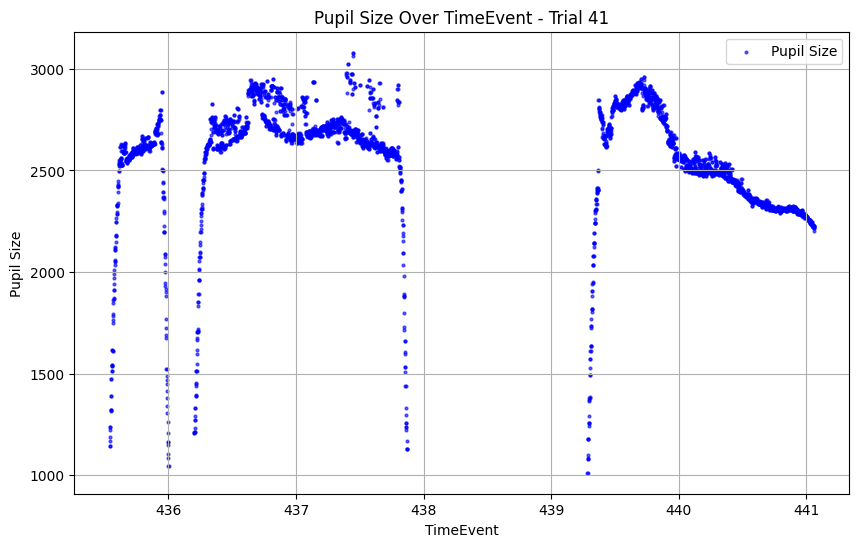

,Type,Event,Time,TimeEvent,Offset,trial_index,X,Y,Pupil,event,Start,End,Duration,Eye,Start_X,Start_Y,End_X,End_Y,Amplitude,Peak_Velocity
195929,Message,initialize,882.076,435.360346,0.0,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
195930,Message,start recording,882.076,435.360693,0.0,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
195931,Message,start,882.205,435.489455,0.0,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
195932,Message,show fixation,882.208,435.492765,0.0,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
195933,Blink,NaN,NaN,NaN,NaN,41,NaN,NaN,NaN,show fixation,435.367765,435.537765,0.171,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199873,Message,done,887.776,441.058446,0.0,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
199874,Gaze,NaN,NaN,441.058446,NaN,41,661.9,534.8,2225.0,done,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
199875,Gaze,NaN,NaN,441.059446,NaN,41,662.0,536.8,2225.0,done,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
199876,Fixation,NaN,NaN,NaN,NaN,41,652.7,544.7,2316.0,done,440.496446,441.059446,0.564,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
pilot3.filter_eye_data_diff_blink(_trial_data, [41], plot=True, rep=0)


In [25]:
from functions import plot_pupil_size

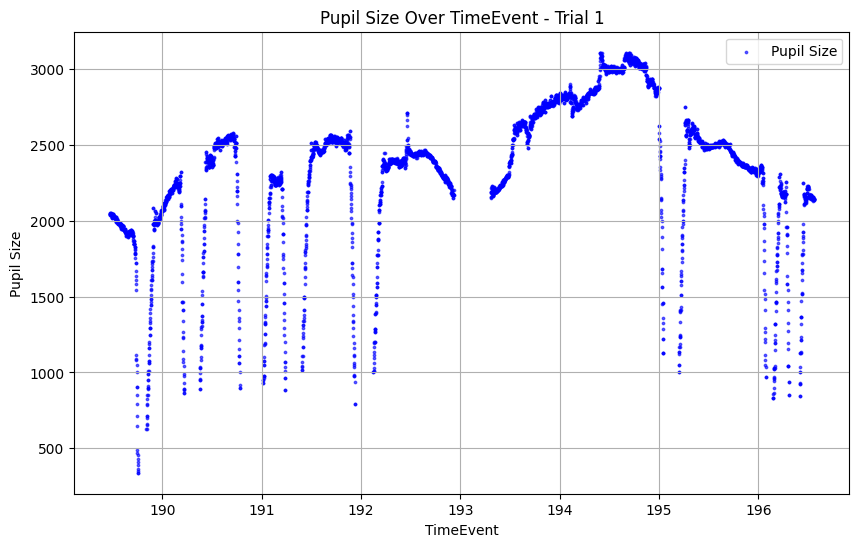

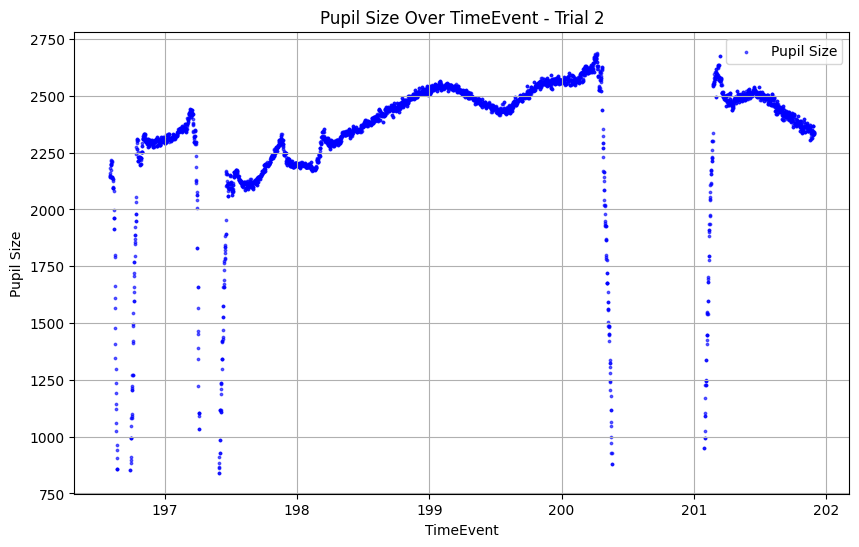

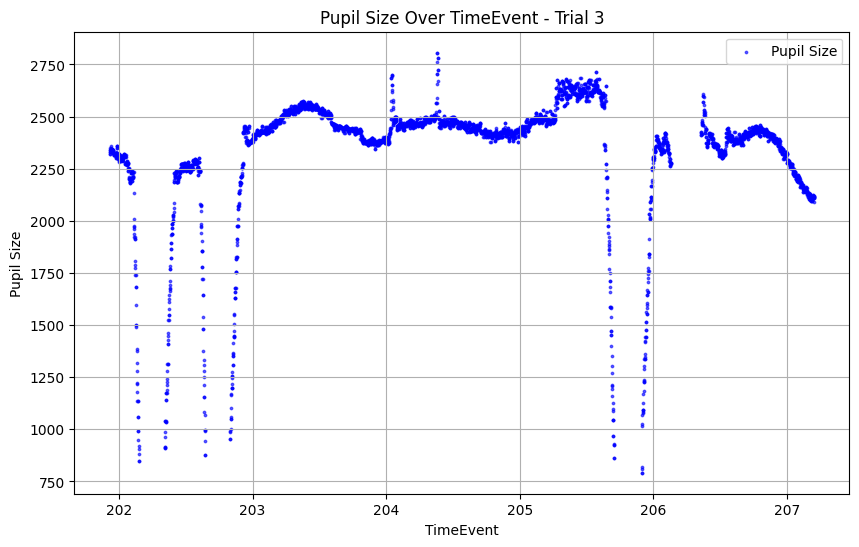

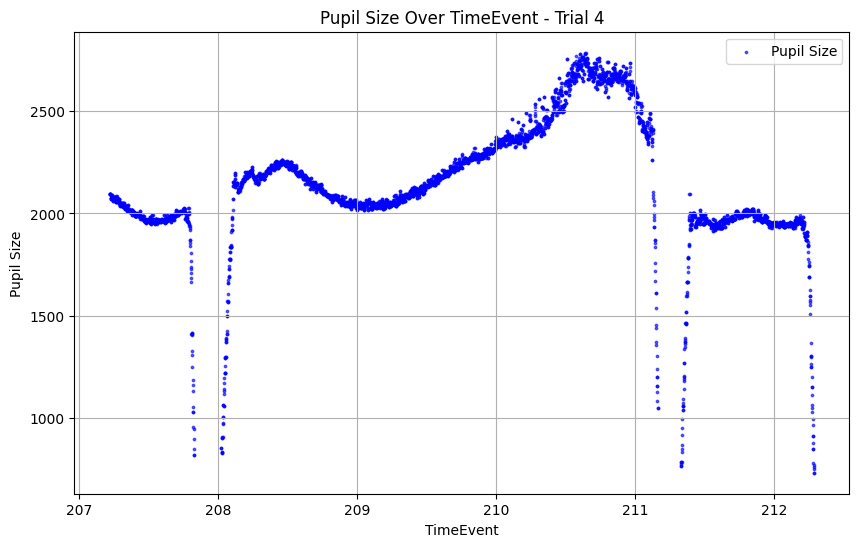

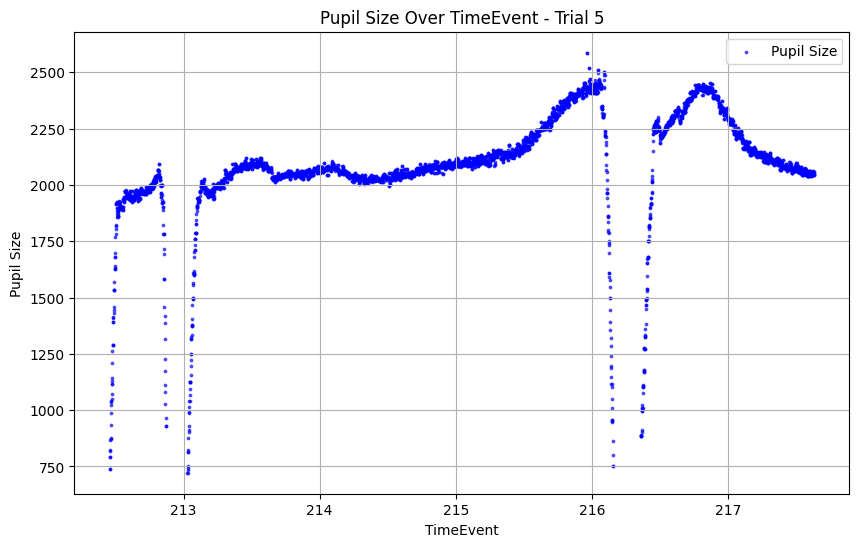

...

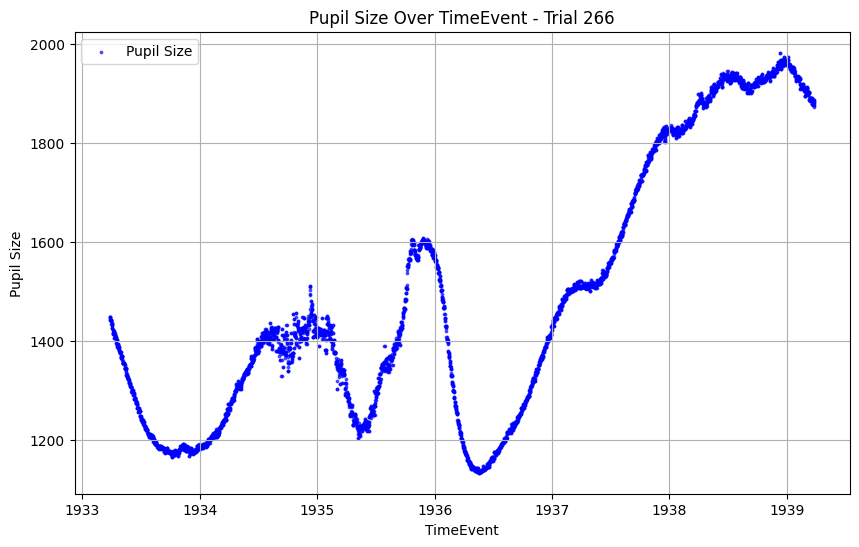

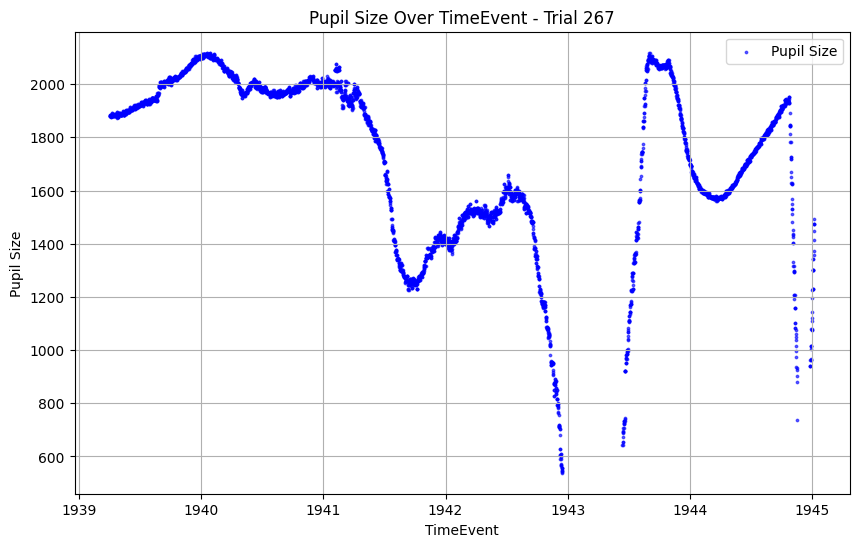

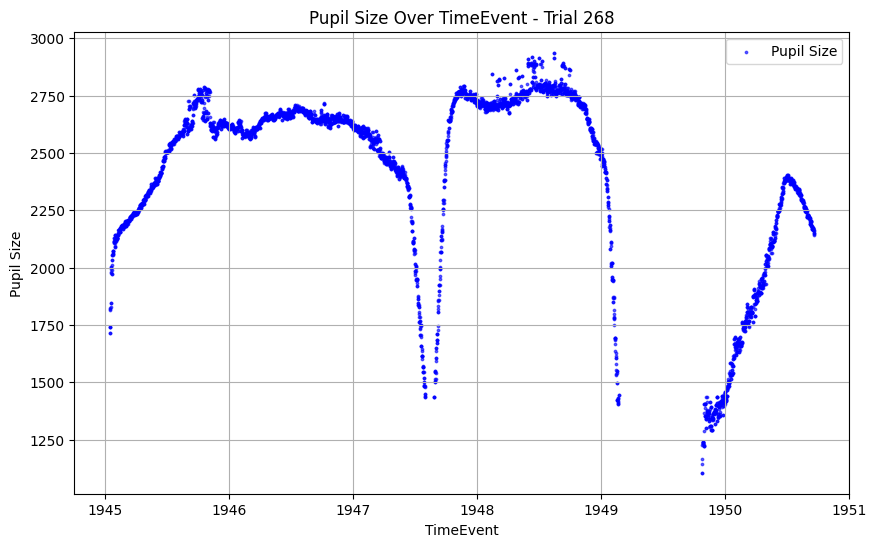

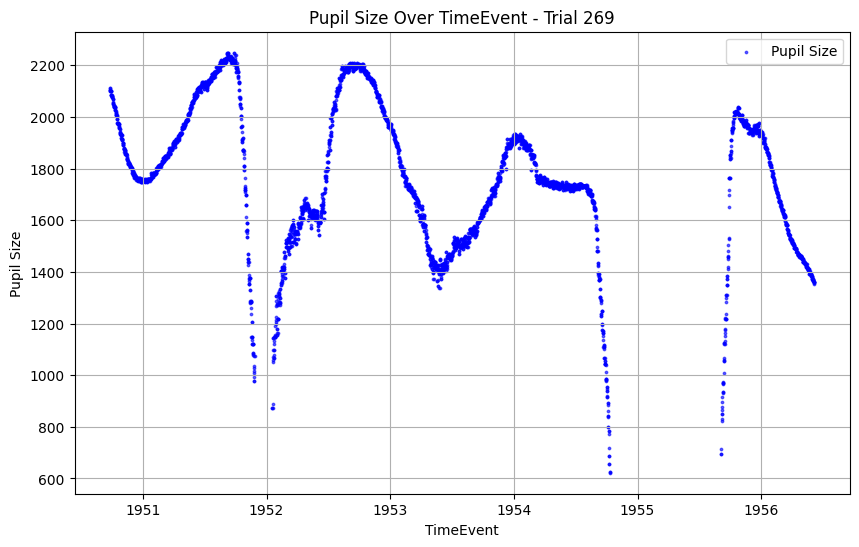

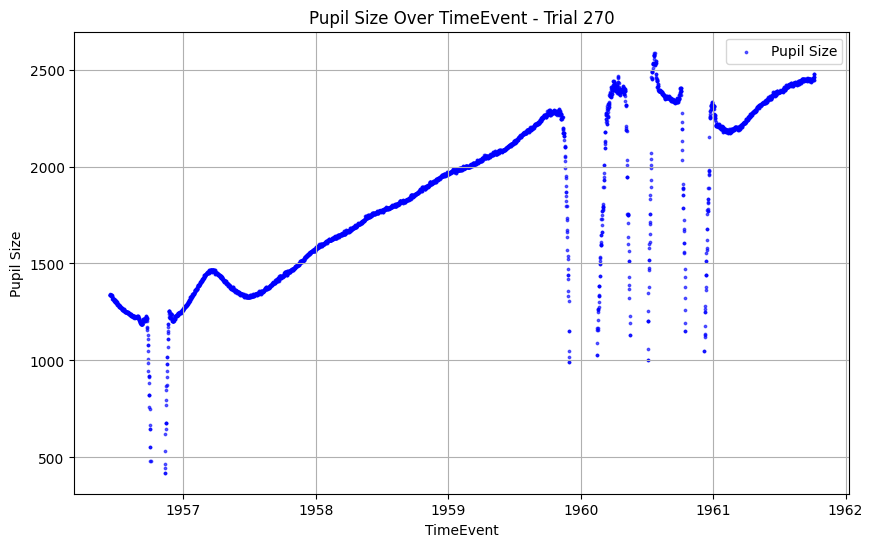

In [26]:
for i in range(270):
    pupil_data = pilot3.eye_raw[pilot3.eye_raw['trial_index'] == i+1]
    plot_pupil_size(pupil_data)

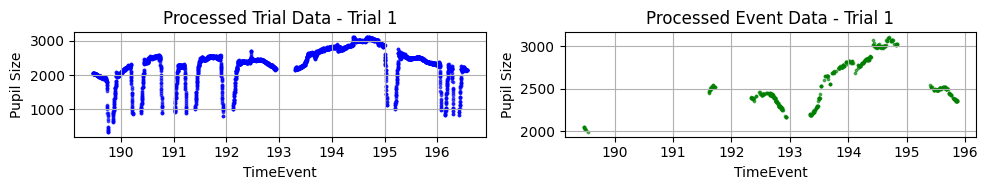

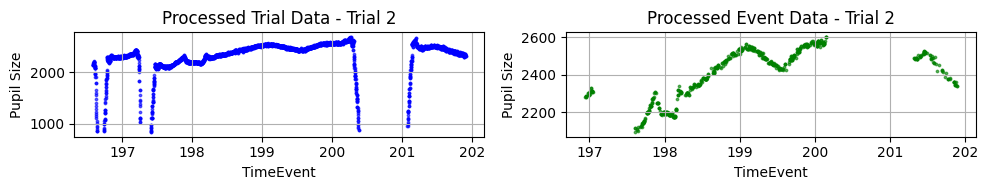

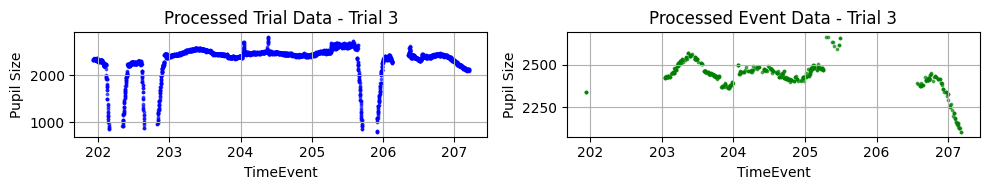

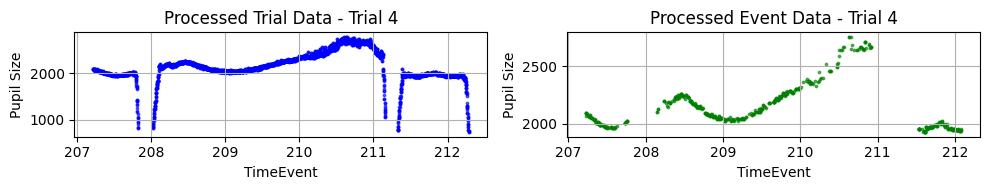

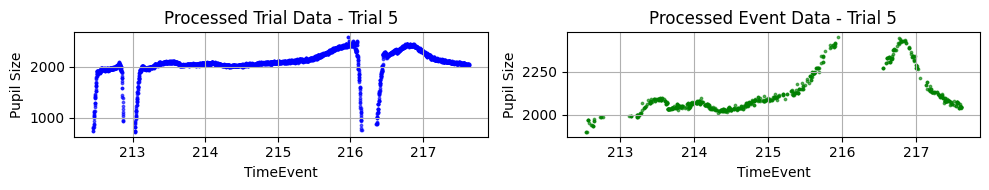

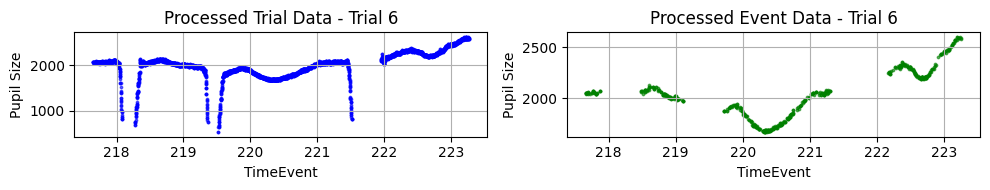

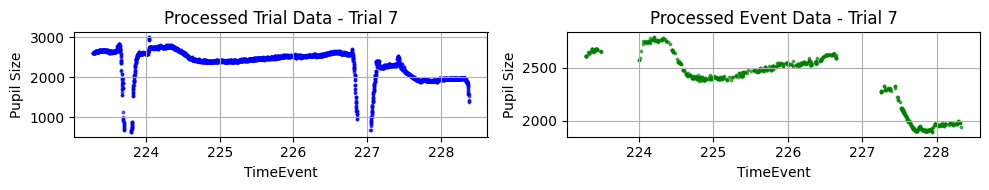

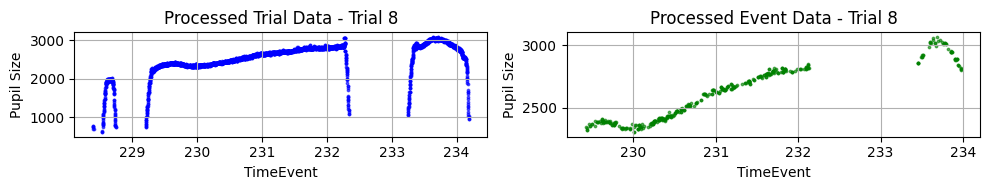

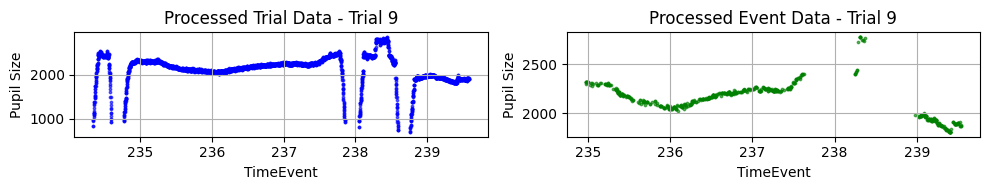

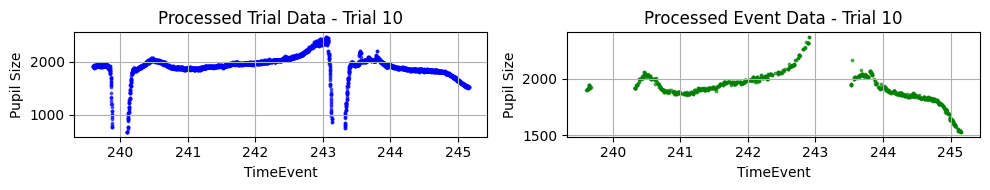

In [20]:
for i in range(10):
    pupil_data = pilot3.eye_raw[pilot3.eye_raw['trial_index'] == i+1]
    filtered_pupil_data = pilot3.filter_eye_data_diff_blink(pupil_data,[i+1])
    ''' Determine time bound '''
  
    fig, axes = plt.subplots(1, 2, figsize=(10, 2))  # 3 rows, 1 column of subplots

    # First subplot
    axes[0].scatter(pupil_data['TimeEvent'], pupil_data['Pupil'], color='blue', alpha=0.6, s=3)
    axes[0].set_title(f"Processed Trial Data - Trial {pupil_data['trial_index'].iloc[0]}")
    axes[0].set_xlabel('TimeEvent')
    axes[0].set_ylabel('Pupil Size')
    axes[0].grid(True)

    # Second subplot
    axes[1].scatter(filtered_pupil_data['TimeEvent'], filtered_pupil_data['Pupil'], color='green', alpha=0.6, s=3)
    axes[1].set_title(f"Processed Event Data - Trial {filtered_pupil_data['trial_index'].iloc[0]}")
    axes[1].set_xlabel('TimeEvent')
    axes[1].set_ylabel('Pupil Size')
    axes[1].grid(True)

    # Adjust layout for better spacing
    plt.tight_layout()

    # Show the plot
    plt.show()


In [8]:
from functions import plot_pupil_size

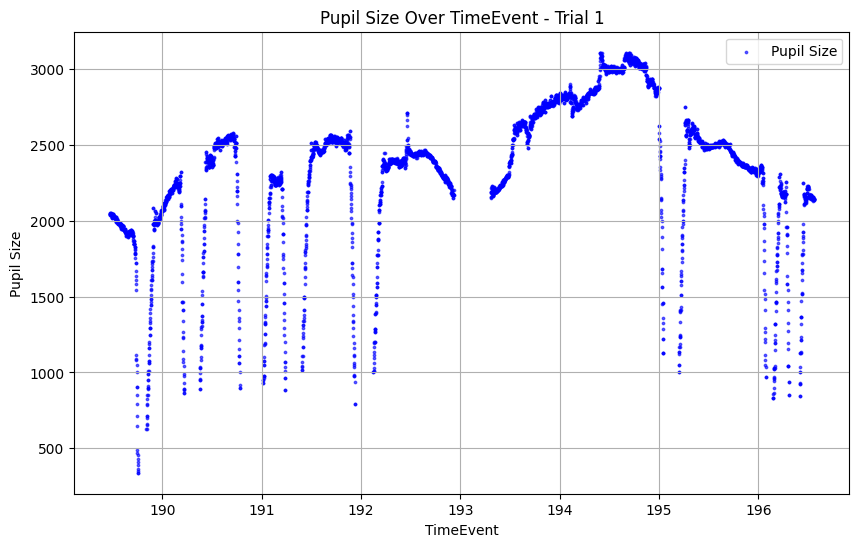

In [9]:
for i in range(1):
    pupil_data = pilot3.eye_raw[pilot3.eye_raw['trial_index'] == i+1]
    plot_pupil_size(pupil_data)

In [16]:
pupil_data = pilot3.eye_raw[pilot3.eye_raw['trial_index'] == 1]


In [17]:
filtered_pupil_data = pilot3.filter_eye_data_diff_blink(pupil_data,[1])


In [14]:
pupil_data['Pupil']

0          NaN
1          NaN
2       2048.0
3       2048.0
4       2048.0
         ...  
5620    2142.0
5621       NaN
5622    2142.0
5623    2170.0
5624    2142.0
Name: Pupil, Length: 5625, dtype: float64